In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
import os
from tqdm import tqdm
import matplotlib.animation as animation
from IPython.display import Video
import matplotlib as mpl
from tropycal import tracks
basin = tracks.TrackDataset()
storm = basin.get_storm(('laura',2020))
%matplotlib inline

--> Starting to read in HURDAT2 data
--> Completed reading in HURDAT2 data (1.86 seconds)


In [2]:
static_ds = xr.open_dataset("/glade/u/home/wchapman/MLWPS/DataLoader/LSM_static_variables_ERA5_zhght.nc")
lsm = static_ds["LSM"][0].values

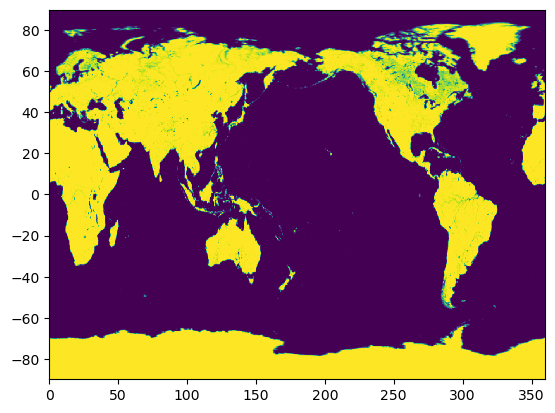

In [28]:
plt.pcolormesh(static_ds["longitude"], static_ds["latitude"], static_ds["LSM"][0])


0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
0


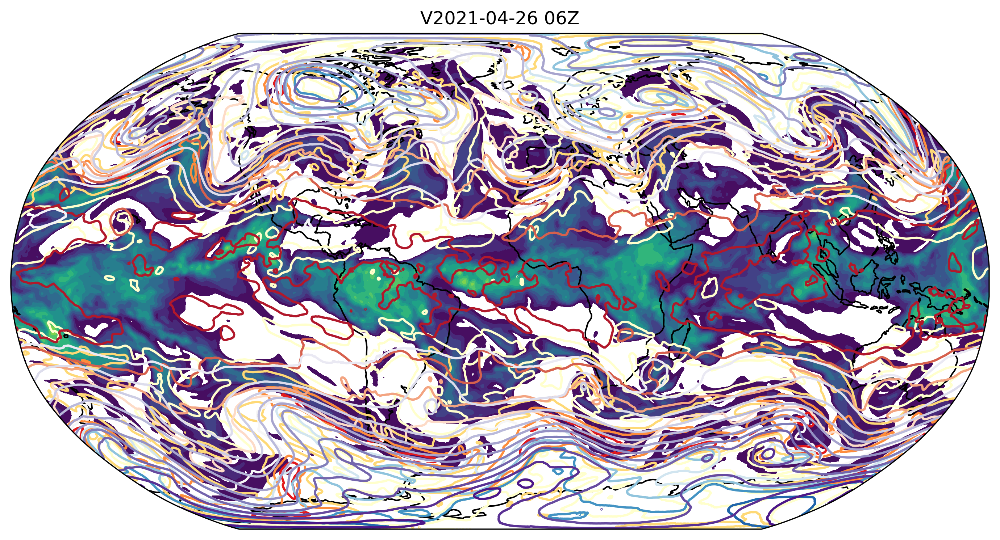

In [49]:
init_date = pd.Timestamp("2021-04-26")
f_dates = pd.date_range(start=init_date + pd.Timedelta(hours=6), end=init_date + pd.Timedelta(hours=240),
                        freq="6h")
path = "/glade/u/home/schreck/scratch/finetune/wx12/netcdf/" + init_date.strftime("%Y-%m-%dT%HZ")
out_dir = "/glade/derecho/scratch/dgagne/credit_q500_images/"
with xr.open_mfdataset(os.path.join(path, "*.nc")) as f_ds:
    fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300, subplot_kw=dict(projection=ccrs.Robinson(central_longitude=340)))
    lon_g, lat_g = np.meshgrid(f_ds["lon"], f_ds["lat"])
    plt.subplots_adjust(0.05, 0.05, 0.95, 0.95) 
    def plot_step(i):
        print(i,)
        f_date = f_dates[i]
        ax.clear()
        ax.set_title(f_date.strftime("V%Y-%m-%d %HZ"), fontsize=12)
        ax.coastlines('110m')
        ax.contourf(lon_g, lat_g, f_ds["Q500"].loc[f_dates[i]] * 1000, np.arange(0.5, 7.5, 0.5), 
                    transform=ccrs.PlateCarree(), transform_first=True)
        wspd = np.sqrt(f_ds["U500"].loc[f_dates[i]] ** 2 + f_ds["V500"].loc[f_dates[i]] ** 2)
        ax.contour(lon_g, lat_g, wspd, np.arange(10, 60, 10), 
                    transform=ccrs.PlateCarree(), transform_first=True, cmap="YlOrRd")
        ax.contour(lon_g, lat_g, f_ds["T500"].loc[f_dates[i]] - 273.15, np.arange(-50, 5, 5),
                    transform=ccrs.PlateCarree(), transform_first=True, cmap="RdBu_r")
        ax.contour(lon_g, lat_g, f_ds["Z500"].loc[f_dates[i]] / 100, np.arange(460, 600, 10),
                    transform=ccrs.PlateCarree(), transform_first=True, cmap="Purples_r")
        return
ani = animation.FuncAnimation(fig, plot_step, frames=f_dates.size)
init_date_str = init_date.strftime("%Y-%m-%dT%HZ")
ani.save(filename=f"credit_all_fields_ani_{init_date}.mp4", writer="ffmpeg", fps=10, dpi=300)

In [46]:
Video("credit_q500_ani.mp4")

In [44]:
f_ds["Z500"][0].min().compute() / 100

<xarray.DataArray 'Z500' ()> Size: 8B
array(468.12726563)
Coordinates:
    time     datetime64[ns] 8B 2020-04-11T06:00:00

0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
0


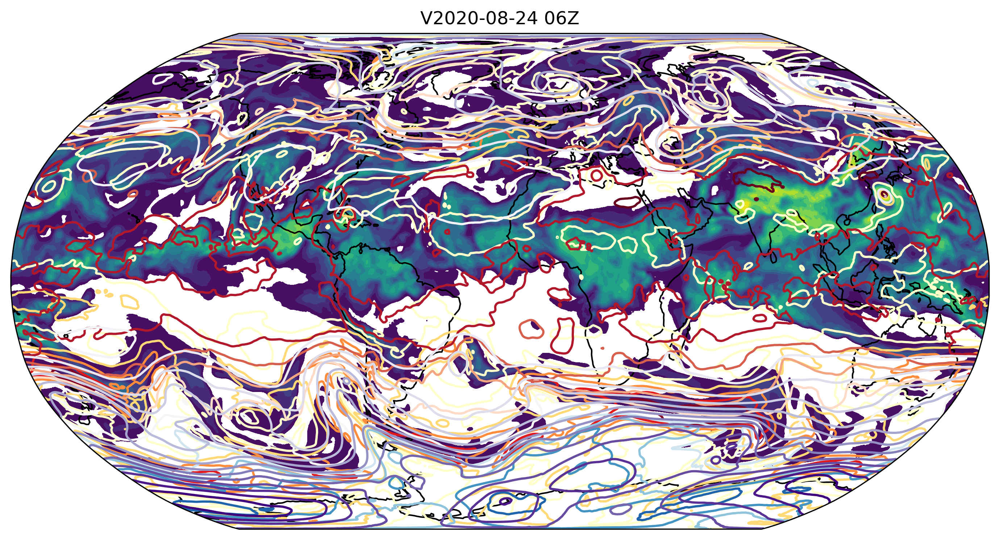

In [97]:
init_date = pd.Timestamp("2020-08-24")
f_dates = pd.date_range(start=init_date + pd.Timedelta(hours=6), end=init_date + pd.Timedelta(hours=120),
                        freq="1h")
path = "/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/wxformer_1h_20241029" 
init_date_str = init_date.strftime("%Y-%m-%dT%HZ")
out_dir = "/glade/derecho/scratch/dgagne/credit_q500_images/"
with xr.open_dataset(os.path.join(path, f"{init_date_str}.nc")) as f_ds:
    fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300, subplot_kw=dict(projection=ccrs.Robinson(central_longitude=340)))
    lon_g, lat_g = np.meshgrid(f_ds["longitude"], f_ds["latitude"])
    plt.subplots_adjust(0.05, 0.05, 0.95, 0.95) 
    def plot_step(i):
        print(i,)
        f_date = f_dates[i]
        ax.clear()
        ax.set_title(f_date.strftime("V%Y-%m-%d %HZ"), fontsize=12)
        ax.coastlines('110m')
        ax.contourf(lon_g, lat_g, f_ds["Q500"].loc[f_dates[i]] * 1000, np.arange(0.5, 7.5, 0.5), 
                    transform=ccrs.PlateCarree(), transform_first=True)
        wspd = np.sqrt(f_ds["U500"].loc[f_dates[i]] ** 2 + f_ds["V500"].loc[f_dates[i]] ** 2)
        ax.contour(lon_g, lat_g, wspd, np.arange(10, 60, 10), 
                    transform=ccrs.PlateCarree(), transform_first=True, cmap="YlOrRd")
        ax.contour(lon_g, lat_g, f_ds["T500"].loc[f_dates[i]] - 273.15, np.arange(-50, 5, 5),
                    transform=ccrs.PlateCarree(), transform_first=True, cmap="RdBu_r")
        ax.contour(lon_g, lat_g, f_ds["Z500"].loc[f_dates[i]] / 100, np.arange(460, 600, 10),
                    transform=ccrs.PlateCarree(), transform_first=True, cmap="Purples_r")
        return
ani = animation.FuncAnimation(fig, plot_step, frames=f_dates.size)
ani.save(filename=f"credit_all_fields_ani_1h_{init_date}.mp4", writer="ffmpeg", fps=10, dpi=300)

In [98]:
Video("credit_all_fields_ani_1h_2020-08-24 00:00:00.mp4")

In [5]:
era5_ds = xr.open_zarr("/glade/campaign/cisl/aiml/wchapman/MLWPS/STAGING/SixHourly_y_TOTAL_2020-01-01_2020-12-31_staged.zarr")

In [38]:
era5_ds


<xarray.Dataset> Size: 341GB
Dimensions:     (time: 1464, level: 16, latitude: 640, longitude: 1280,
                 half_level: 138)
Coordinates:
  * half_level  (half_level) int32 552B 1 2 3 4 5 6 ... 133 134 135 136 137 138
  * latitude    (latitude) float64 5kB 89.78 89.51 89.23 ... -89.51 -89.78
  * level       (level) int64 128B 10 30 40 50 60 70 ... 105 110 120 130 136 137
  * longitude   (longitude) float64 10kB 0.0 0.2812 0.5625 ... 359.2 359.4 359.7
  * time        (time) datetime64[ns] 12kB 2020-01-01 ... 2020-12-31T18:00:00
Data variables:
    Q           (time, level, latitude, longitude) float32 77GB dask.array<chunksize=(10, 2, 640, 1240), meta=np.ndarray>
    Q500        (time, latitude, longitude) float32 5GB dask.array<chunksize=(10, 640, 1240), meta=np.ndarray>
    SP          (time, latitude, longitude) float32 5GB dask.array<chunksize=(10, 640, 1240), meta=np.ndarray>
    T           (time, level, latitude, longitude) float32 77GB dask.array<chunksize=(10, 2, 640, 1240), meta=np.ndarray>
    T500        (time, latitude, longitude) float32 5GB dask.array<chunksize=(10, 640, 1240), meta=np.ndarray>
    U           (time, level, latitude, longitude) float32 77GB dask.array<chunksize=(10, 2, 640, 1240), meta=np.ndarray>
    U500        (time, latitude, longitude) float32 5GB dask.array<chunksize=(10, 640, 1240), meta=np.ndarray>
    V           (time, level, latitude, longitude) float32 77GB dask.array<chunksize=(10, 2, 640, 1240), meta=np.ndarray>
    V500        (time, latitude, longitude) float32 5GB dask.array<chunksize=(10, 640, 1240), meta=np.ndarray>
    Z500        (time, latitude, longitude) float32 5GB dask.array<chunksize=(10, 640, 1240), meta=np.ndarray>
    t2m         (time, latitude, longitude) float32 5GB dask.array<chunksize=(10, 640, 1240), meta=np.ndarray>

In [ ]:
from matplotlib.gridspec import GridSpec


DatetimeIndex(['2020-08-16 00:00:00', '2020-08-16 12:00:00',
               '2020-08-17 00:00:00', '2020-08-17 12:00:00',
               '2020-08-18 00:00:00', '2020-08-18 12:00:00',
               '2020-08-19 00:00:00', '2020-08-19 12:00:00',
               '2020-08-20 00:00:00', '2020-08-20 12:00:00',
               '2020-08-21 00:00:00', '2020-08-21 12:00:00',
               '2020-08-22 00:00:00', '2020-08-22 12:00:00',
               '2020-08-23 00:00:00', '2020-08-23 12:00:00',
               '2020-08-24 00:00:00', '2020-08-24 12:00:00',
               '2020-08-25 00:00:00', '2020-08-25 12:00:00',
               '2020-08-26 00:00:00', '2020-08-26 12:00:00',
               '2020-08-27 00:00:00'],
              dtype='datetime64[ns]', freq='12h')
Valid 2020-08-23 00:00:00
2020-08-18 00:00:00
2020-08-18 12:00:00
2020-08-19 00:00:00
2020-08-19 12:00:00
2020-08-20 00:00:00
2020-08-20 12:00:00
2020-08-21 00:00:00
2020-08-21 12:00:00
2020-08-22 00:00:00
2020-08-22 12:00:00
Valid 2020-08-

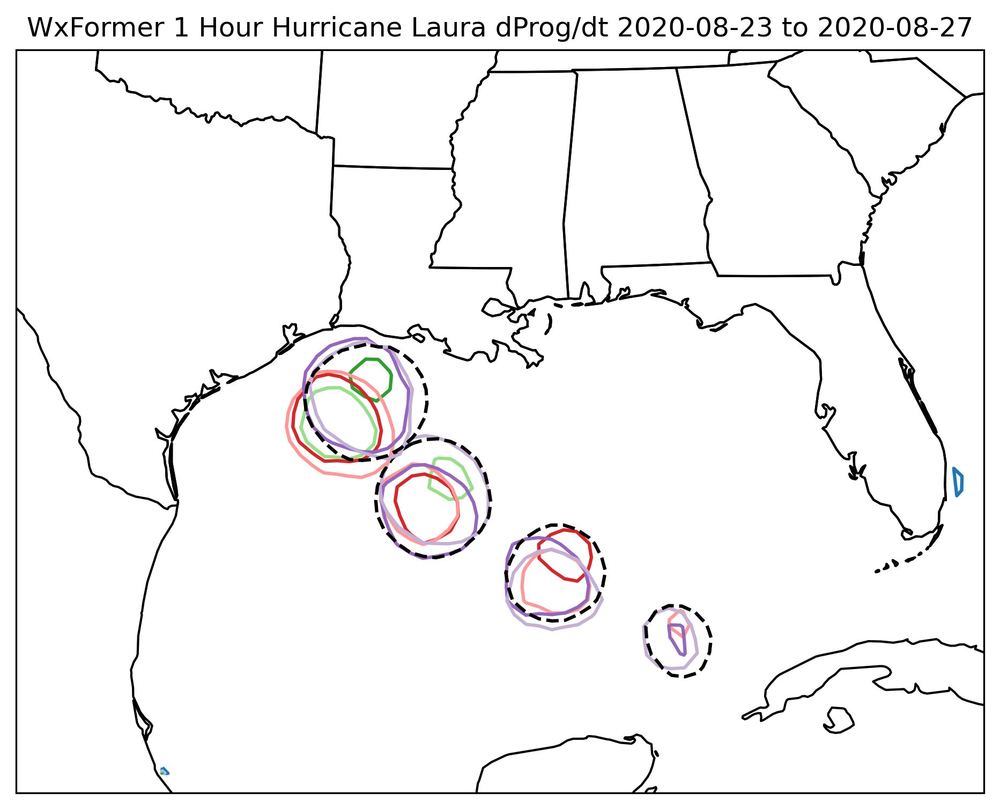

In [72]:
init_date = pd.Timestamp("2020-08-16")
end_date = pd.Timestamp("2020-08-27")
i_dates = pd.date_range(start=init_date, end=end_date,
                        freq="12h")
print(i_dates)
path = "/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/wxformer_1h_20241029" 
init_date_str = init_date.strftime("%Y-%m-%dT%HZ")
out_dir = "/glade/derecho/scratch/dgagne/credit_q500_images/"
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300, subplot_kw=dict(projection=ccrs.LambertConformal(central_latitude=30, central_longitude=270)))
#cmap = mpl.colormaps['Reds']
#colors = cmap(np.linspace(0, 1, 12))
cmap = mpl.colormaps['tab20']
colors = cmap(np.arange(0, 0.5, 0.05))
valid_dates = pd.date_range(start="2020-08-23", end="2020-08-27", freq="12h")
ax.set_extent([260, 280, 20, 35], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.STATES, edgecolor='k')
for valid_date in valid_dates:
    print("Valid", valid_date)
    v_val = 0
    for i, i_date in enumerate(i_dates):
        i_date_str = i_date.strftime("%Y-%m-%dT%HZ")
        with xr.open_dataset(os.path.join(path, f"{i_date_str}.nc")) as f_ds:
            if valid_date in f_ds["time"]:
                print(i_date)
                
                plotted_arr = np.where(lsm < 0.3, f_ds["SP"].loc[valid_date].values / 
                                          100, 2000.0)
                lon_g, lat_g = np.meshgrid(f_ds["longitude"], f_ds["latitude"])
                ax.contour(lon_g, lat_g, plotted_arr, [1000.0], 
                           colors=[colors[v_val]], 
                           transform_first=True, transform=ccrs.PlateCarree())
                v_val += 1
    e5_arr = np.where(lsm < 0.3, era5_ds["SP"].loc[valid_date].values / 100, 2000.0)
    ax.contour(lon_g, lat_g, e5_arr, [1000], colors=['k'], transform_first=True, transform=ccrs.PlateCarree(), linestyles=['--'])
plt.title("WxFormer 1 Hour Hurricane Laura dProg/dt 2020-08-23 to 2020-08-27")
plt.savefig("wxformer_1h_hurricane_laura.png", dpi=300, bbox_inches="tight")

DatetimeIndex(['2020-08-20 12:00:00', '2020-08-21 00:00:00',
               '2020-08-21 12:00:00', '2020-08-22 00:00:00',
               '2020-08-22 12:00:00', '2020-08-23 00:00:00',
               '2020-08-23 12:00:00', '2020-08-24 00:00:00',
               '2020-08-24 12:00:00', '2020-08-25 00:00:00',
               '2020-08-25 12:00:00', '2020-08-26 00:00:00',
               '2020-08-26 12:00:00', '2020-08-27 00:00:00'],
              dtype='datetime64[ns]', freq='12h')
Valid 2020-08-25 12:00:00
2020-08-20 12:00:00
2020-08-21 00:00:00
2020-08-21 12:00:00
2020-08-22 00:00:00
2020-08-22 12:00:00
2020-08-23 00:00:00
2020-08-23 12:00:00
2020-08-24 00:00:00
2020-08-24 12:00:00
2020-08-25 00:00:00
Valid 2020-08-26 00:00:00
2020-08-20 12:00:00
2020-08-21 00:00:00
2020-08-21 12:00:00
2020-08-22 00:00:00
2020-08-22 12:00:00
2020-08-23 00:00:00
2020-08-23 12:00:00
2020-08-24 00:00:00
2020-08-24 12:00:00
2020-08-25 00:00:00
2020-08-25 12:00:00
Valid 2020-08-26 12:00:00
2020-08-20 12:00:00
2020

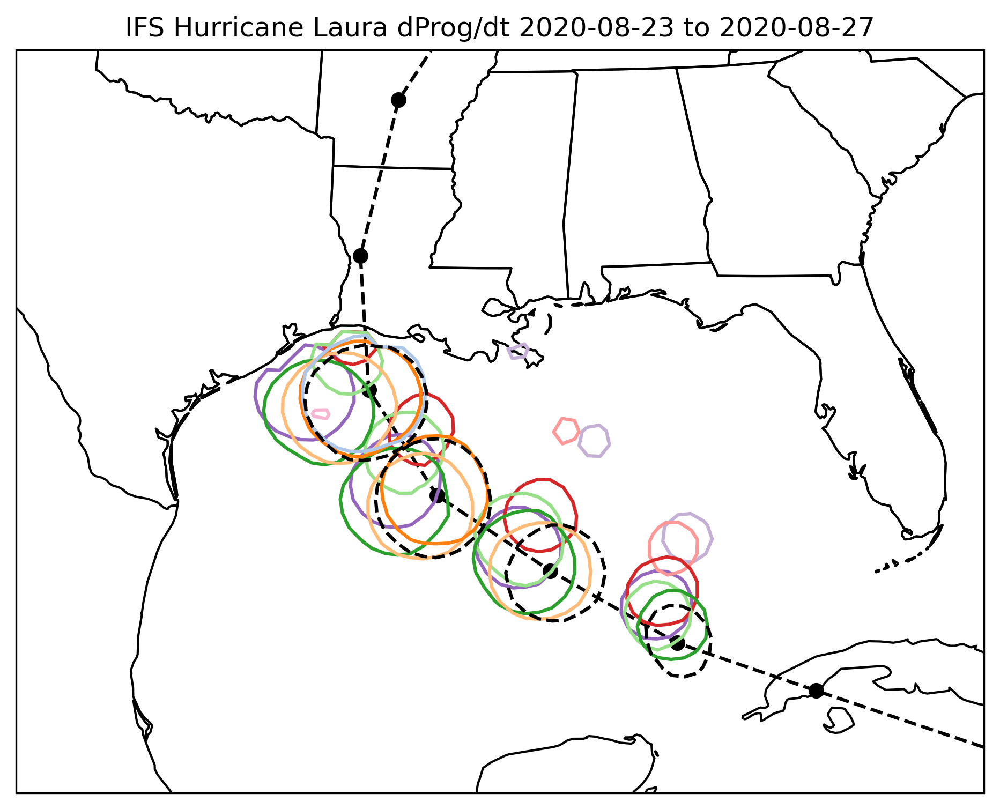

In [131]:
init_date = pd.Timestamp("2020-08-20 12:00")
end_date = pd.Timestamp("2020-08-27")
i_dates = pd.date_range(start=init_date, end=end_date,
                        freq="12h")
print(i_dates)
path = "/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/IFS/" 
init_date_str = init_date.strftime("%Y-%m-%dT%HZ")
out_dir = "/glade/derecho/scratch/dgagne/credit_q500_images/"
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300, subplot_kw=dict(projection=ccrs.LambertConformal(central_latitude=30, central_longitude=270)))
#cmap = mpl.colormaps['Reds']
#colors = cmap(np.linspace(0, 1, 12))
cmap = mpl.colormaps['tab20']
colors = cmap(np.arange(0, 0.7, 0.05)[::-1])
valid_dates = pd.date_range(start="2020-08-25 12:00", end="2020-08-27", freq="12h")
ax.set_extent([260, 280, 20, 35], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.STATES, edgecolor='k')
ax.plot(storm.lon[::2], storm.lat[::2], 'ko--', transform=ccrs.PlateCarree())
for valid_date in valid_dates:
    print("Valid", valid_date)
    v_val = 0
    for i, i_date in enumerate(i_dates):
        i_date_str = i_date.strftime("%Y-%m-%dT%HZ")
        with xr.open_dataset(os.path.join(path, f"IFS_{i_date_str}.nc")) as f_ds:
            if valid_date in f_ds["time"]:
                print(i_date)
                
                plotted_arr = np.where(lsm < 0.3, f_ds["SP"].loc[valid_date].values / 
                                          100, 2000.0)
                lon_g, lat_g = np.meshgrid(f_ds["lon"], f_ds["lat"])
                ax.contour(lon_g, lat_g, plotted_arr, [1000.0], 
                           colors=[colors[v_val]], 
                           transform_first=True, transform=ccrs.PlateCarree())
                v_val += 1
    e5_arr = np.where(lsm < 0.3, era5_ds["SP"].loc[valid_date].values / 100, 2000.0)
    ax.contour(lon_g, lat_g, e5_arr, [1000], colors=['k'], transform_first=True, transform=ccrs.PlateCarree(), linestyles=['--'])
plt.title("IFS Hurricane Laura dProg/dt 2020-08-23 to 2020-08-27")
plt.savefig("ifs_hurricane_laura.png", dpi=300, bbox_inches="tight")

DatetimeIndex(['2020-08-20 12:00:00', '2020-08-21 00:00:00',
               '2020-08-21 12:00:00', '2020-08-22 00:00:00',
               '2020-08-22 12:00:00', '2020-08-23 00:00:00',
               '2020-08-23 12:00:00', '2020-08-24 00:00:00',
               '2020-08-24 12:00:00', '2020-08-25 00:00:00',
               '2020-08-25 12:00:00', '2020-08-26 00:00:00',
               '2020-08-26 12:00:00', '2020-08-27 00:00:00'],
              dtype='datetime64[ns]', freq='12h')
Valid 2020-08-25 12:00:00
2020-08-25 00:00:00
2020-08-24 12:00:00
2020-08-24 00:00:00
2020-08-23 12:00:00
2020-08-23 00:00:00
2020-08-22 12:00:00
2020-08-22 00:00:00
2020-08-21 12:00:00
2020-08-21 00:00:00
2020-08-20 12:00:00
Valid 2020-08-26 00:00:00
2020-08-25 12:00:00
2020-08-25 00:00:00
2020-08-24 12:00:00
2020-08-24 00:00:00
2020-08-23 12:00:00
2020-08-23 00:00:00
2020-08-22 12:00:00
2020-08-22 00:00:00
2020-08-21 12:00:00
2020-08-21 00:00:00
Valid 2020-08-26 12:00:00
2020-08-26 00:00:00
2020-08-25 12:00:00
2020

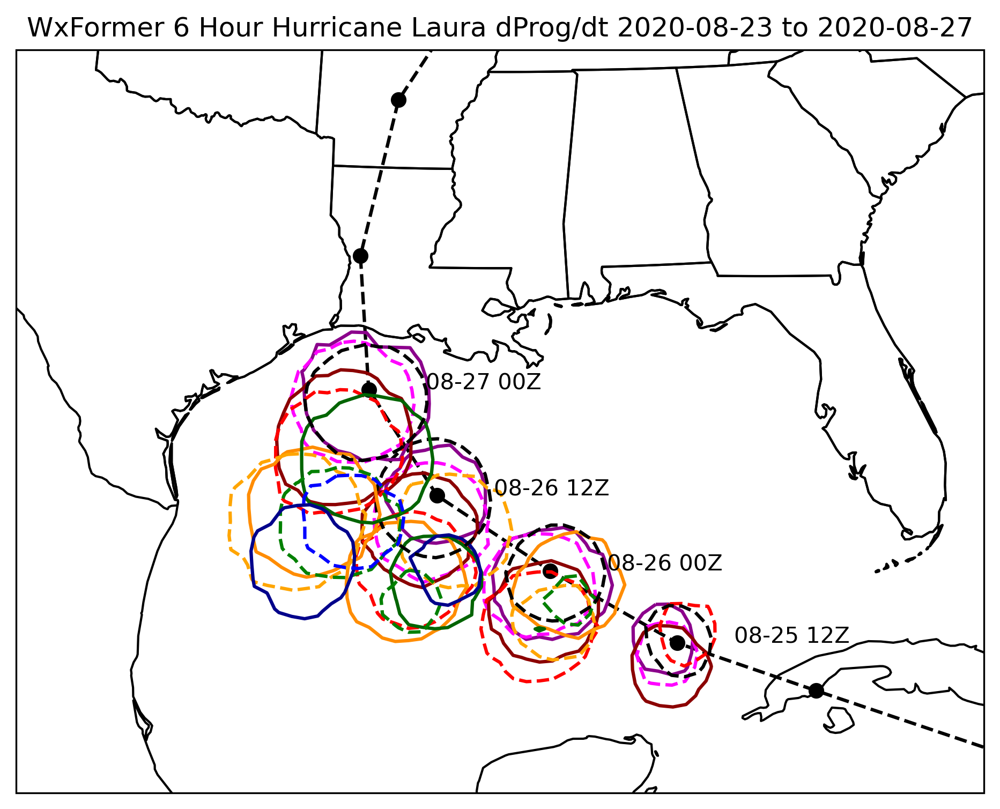

In [175]:
init_date = pd.Timestamp("2020-08-20 12:00")
end_date = pd.Timestamp("2020-08-27")
i_dates = pd.date_range(start=init_date, end=end_date,
                        freq="12h")
print(i_dates)
path = "/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/wxformer_6h_20241029" 
init_date_str = init_date.strftime("%Y-%m-%dT%HZ")
out_dir = "/glade/derecho/scratch/dgagne/credit_q500_images/"

fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300, subplot_kw=dict(projection=ccrs.LambertConformal(central_latitude=30, central_longitude=270)))
#cmap = mpl.colormaps['Reds']
#colors = cmap(np.linspace(0, 1, 12))
color_list = ["darkmagenta", "magenta",
                                   "darkred", "red", 
                                   "darkorange", "orange", 
                                   "darkgreen", "green", 
                                   "darkblue", "blue",
                                   ]
cmap2 = mpl.colors.ListedColormap(['k'])
valid_dates = pd.date_range(start="2020-08-25 12:00", end="2020-08-27", freq="12h")
ax.set_extent([260, 280, 20, 35], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.STATES, edgecolor='k')
ax.plot(storm.lon[::2], storm.lat[::2], 'ko--', transform=ccrs.PlateCarree())
for valid_date in valid_dates:
    print("Valid", valid_date)
    v_val = 0
    i_dates = pd.date_range(start=valid_date - pd.Timedelta(hours=120), end=valid_date - pd.Timedelta(hours=12),
                        freq="12h")
    for i, i_date in enumerate(i_dates[::-1]):
        i_date_str = i_date.strftime("%Y-%m-%dT%HZ")
        with xr.open_dataset(os.path.join(path, f"{i_date_str}.nc")) as f_ds:
            if valid_date in f_ds["time"]:
                print(i_date)
                
                plotted_arr = np.where(lsm < 0.3, f_ds["SP"].loc[valid_date].values / 
                                          100, 2000.0)
                lon_g, lat_g = np.meshgrid(f_ds["longitude"], f_ds["latitude"])
                if i % 2 == 1:
                    ls = '--'
                else:
                    ls = '-'
                ax.contour(lon_g, lat_g, plotted_arr, [1000.0], 
                           colors=[color_list[v_val]], 
                           transform_first=True, transform=ccrs.PlateCarree(), linestyles=[ls])
                v_val += 1
    e5_arr = np.where(lsm < 0.3, era5_ds["SP"].loc[valid_date].values / 100, 2000.0)
    ax.contour(lon_g, lat_g, e5_arr, [1000], colors=['k'], transform_first=True, transform=ccrs.PlateCarree(), linestyles=['--'])
    t = storm.time == valid_date
    ax.text(storm.lon[t], storm.lat[t], valid_date.strftime("        %m-%d %HZ"), transform=ccrs.PlateCarree(), fontsize=10)
plt.title("WxFormer 6 Hour Hurricane Laura dProg/dt 2020-08-23 to 2020-08-27")
plt.savefig("wxformer_6h_hurricane_laura.png", dpi=300, bbox_inches="tight")

DatetimeIndex(['2020-08-17 00:00:00', '2020-08-17 12:00:00',
               '2020-08-18 00:00:00', '2020-08-18 12:00:00',
               '2020-08-19 00:00:00', '2020-08-19 12:00:00',
               '2020-08-20 00:00:00', '2020-08-20 12:00:00',
               '2020-08-21 00:00:00', '2020-08-21 12:00:00',
               '2020-08-22 00:00:00', '2020-08-22 12:00:00',
               '2020-08-23 00:00:00', '2020-08-23 12:00:00',
               '2020-08-24 00:00:00', '2020-08-24 12:00:00',
               '2020-08-25 00:00:00', '2020-08-25 12:00:00',
               '2020-08-26 00:00:00', '2020-08-26 12:00:00',
               '2020-08-27 00:00:00'],
              dtype='datetime64[ns]', freq='12h')
Valid 2020-08-25 12:00:00
Valid 2020-08-26 00:00:00
Valid 2020-08-26 12:00:00
Valid 2020-08-27 00:00:00


Text(0.5, 1.0, 'WxFormer 6 Hour Hurricane Laura dProg/dt 2020-08-23 to 2020-08-27')

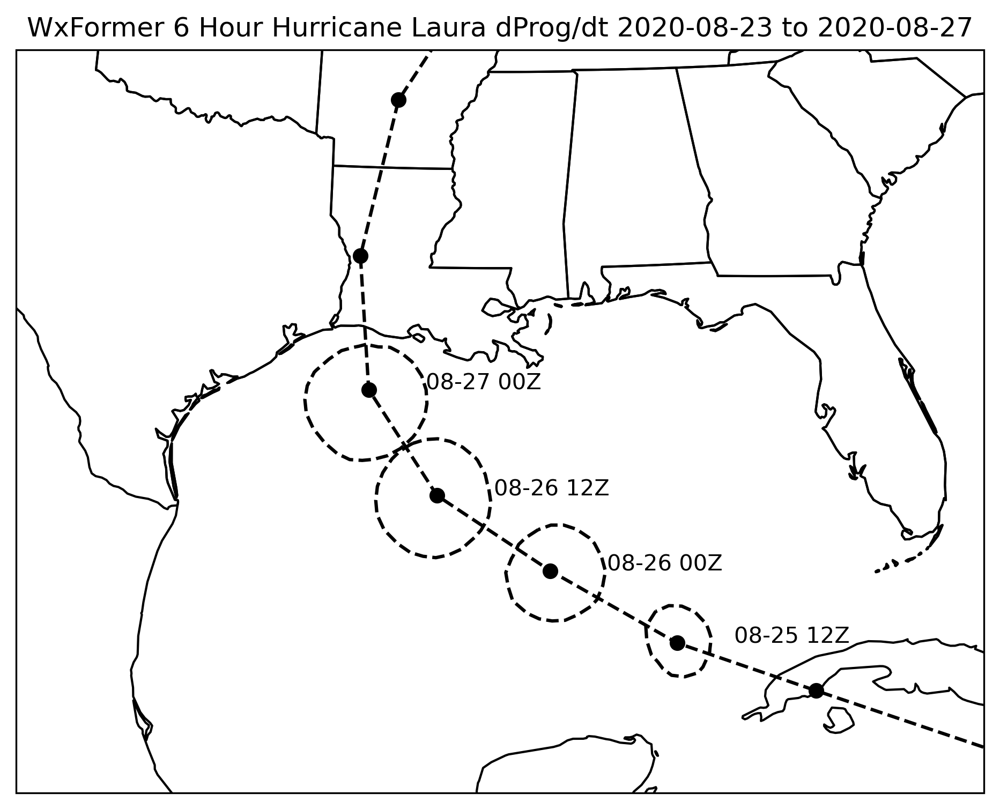

In [128]:
init_date = pd.Timestamp("2020-08-17")
end_date = pd.Timestamp("2020-08-27")
i_dates = pd.date_range(start=init_date, end=end_date,
                        freq="12h")
print(i_dates)
path = "/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/wxformer_6h_20241029" 
init_date_str = init_date.strftime("%Y-%m-%dT%HZ")
out_dir = "/glade/derecho/scratch/dgagne/credit_q500_images/"
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300, subplot_kw=dict(projection=ccrs.LambertConformal(central_latitude=30, central_longitude=270)))
#cmap = mpl.colormaps['Reds']
#colors = cmap(np.linspace(0, 1, 12))
cmap = mpl.colormaps['tab20']
colors = cmap(np.arange(0, 1, 0.05)[::-1])
valid_dates = pd.date_range(start="2020-08-25 12:00", end="2020-08-27", freq="12h")
ax.set_extent([260, 278, 20, 35], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.STATES, edgecolor='k')
ax.plot(storm.lon[::2], storm.lat[::2], 'ko--', transform=ccrs.PlateCarree())
for valid_date in valid_dates:
    print("Valid", valid_date)
    e5_arr = np.where(lsm < 0.3, era5_ds["SP"].loc[valid_date].values / 100, 2000.0)
    lon_g, lat_g = np.meshgrid(era5_ds["longitude"], era5_ds["latitude"])
    ax.contour(lon_g, lat_g, e5_arr, [1000], colors=['k'], transform_first=True, transform=ccrs.PlateCarree(), linestyles=['--'])
    t = storm.time == valid_date
    ax.text(storm.lon[t], storm.lat[t], valid_date.strftime("        %m-%d %HZ"), transform=ccrs.PlateCarree(), fontsize=10)
plt.title("WxFormer 6 Hour Hurricane Laura dProg/dt 2020-08-23 to 2020-08-27")

WXFormer 6 Hours
Valid 2020-08-25 12:00:00
2020-08-25 00:00:00
2020-08-24 12:00:00
2020-08-24 00:00:00
2020-08-23 12:00:00
2020-08-23 00:00:00
2020-08-22 12:00:00
2020-08-22 00:00:00
2020-08-21 12:00:00
2020-08-21 00:00:00
2020-08-20 12:00:00
Valid 2020-08-26 00:00:00
2020-08-25 12:00:00
2020-08-25 00:00:00
2020-08-24 12:00:00
2020-08-24 00:00:00
2020-08-23 12:00:00
2020-08-23 00:00:00
2020-08-22 12:00:00
2020-08-22 00:00:00
2020-08-21 12:00:00
2020-08-21 00:00:00
Valid 2020-08-26 12:00:00
2020-08-26 00:00:00
2020-08-25 12:00:00
2020-08-25 00:00:00
2020-08-24 12:00:00
2020-08-24 00:00:00
2020-08-23 12:00:00
2020-08-23 00:00:00
2020-08-22 12:00:00
2020-08-22 00:00:00
2020-08-21 12:00:00
Valid 2020-08-27 00:00:00
2020-08-26 12:00:00
2020-08-26 00:00:00
2020-08-25 12:00:00
2020-08-25 00:00:00
2020-08-24 12:00:00
2020-08-24 00:00:00
2020-08-23 12:00:00
2020-08-23 00:00:00
2020-08-22 12:00:00
2020-08-22 00:00:00
FuXi 6 Hours
Valid 2020-08-25 12:00:00
2020-08-25 00:00:00
2020-08-24 12:00:00


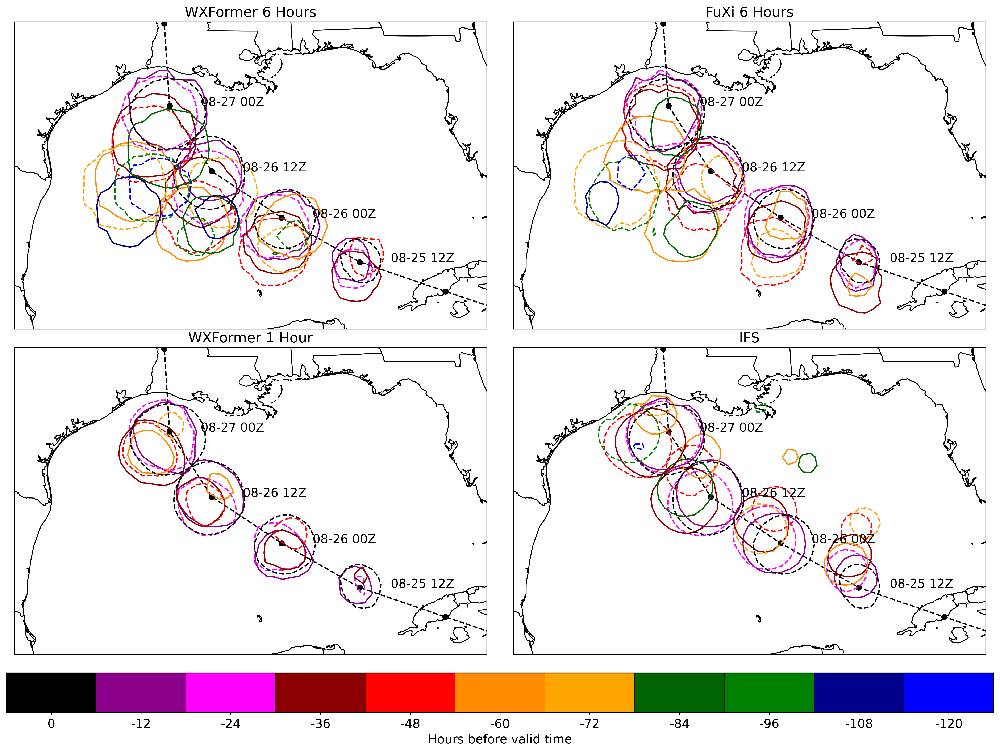

In [7]:
def plot_hurricane_contours(model_path, model_name, ax, extent= (260, 280, 20, 35)):
    color_list = ["darkmagenta", "magenta",
                                       "darkred", "red", 
                                       "darkorange", "orange", 
                                       "darkgreen", "green", 
                                       "darkblue", "blue",
                                       ]
    valid_dates = pd.date_range(start="2020-08-25 12:00", end="2020-08-27", freq="12h")
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.STATES, edgecolor='k')
    ax.plot(storm.lon[::2], storm.lat[::2], 'ko--', transform=ccrs.PlateCarree())
    for valid_date in valid_dates:
        print("Valid", valid_date)
        v_val = 0
        i_dates = pd.date_range(start=valid_date - pd.Timedelta(hours=120), end=valid_date - pd.Timedelta(hours=12),
                            freq="12h")
        for i, i_date in enumerate(i_dates[::-1]):
            i_date_str = i_date.strftime("%Y-%m-%dT%HZ")
            lon_var = "longitude"
            lat_var = "latitude"
            if model_name == "IFS":
                i_date_str = "IFS_" + i_date_str
                lon_var = "lon"
                lat_var = "lat"
            with xr.open_dataset(os.path.join(model_path, f"{i_date_str}.nc")) as f_ds:
                if valid_date in f_ds["time"]:
                    print(i_date)
                    
                    plotted_arr = np.where(lsm < 0.3, f_ds["SP"].loc[valid_date].values / 
                                              100, 2000.0)
                    lon_g, lat_g = np.meshgrid(f_ds[lon_var], f_ds[lat_var])
                    if i % 2 == 1:
                        ls = '--'
                    else:
                        ls = '-'
                    ax.contour(lon_g, lat_g, plotted_arr, [1000.0], 
                               colors=[color_list[v_val]], 
                               transform_first=True, transform=ccrs.PlateCarree(), linestyles=[ls])
                    v_val += 1
        e5_arr = np.where(lsm < 0.3, era5_ds["SP"].loc[valid_date].values / 100, 2000.0)
        ax.contour(lon_g, lat_g, e5_arr, [1000], colors=['k'], transform_first=True, transform=ccrs.PlateCarree(), linestyles=['--'])
        t = storm.time == valid_date
        ax.text(storm.lon[t], storm.lat[t], valid_date.strftime("        %m-%d %HZ"), transform=ccrs.PlateCarree(), fontsize=14)
    plt.title(f"{model_name}", fontsize=16)


fig = plt.figure(figsize=(16, 12), dpi=300)
gs = mpl.gridspec.GridSpec(3, 2, height_ratios=[4.7, 4.7, 0.6])
proj = ccrs.LambertConformal(central_latitude=30, central_longitude=270)
paths = ["/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/wxformer_6h_20241029/",
         "/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/fuxi_6h_20241029/",
         "/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/wxformer_1h_20241029/",
         "/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/IFS/"]
model_names = ["WXFormer 6 Hours", "FuXi 6 Hours", "WXFormer 1 Hour", "IFS"]
extent= (262, 278, 21, 31)
for m in range(4):
    print(model_names[m])
    ax = fig.add_subplot(gs[m], projection=proj)
    plot_hurricane_contours(paths[m], model_names[m], ax, extent)
cax = fig.add_subplot(gs[4:6])
color_list = ["k", "darkmagenta", "magenta",
                                   "darkred", "red", 
                                   "darkorange", "orange", 
                                   "darkgreen", "green", 
                                   "darkblue", "blue",
                                   ]
cmap2 = mpl.colors.ListedColormap(color_list)
cax.pcolor(np.arange(0, 11).reshape(-1,1).T, cmap=cmap2, edgecolor='k')
cax.set_xticks(np.arange(11) + 0.5, np.arange(-12 * 10, 12, 12)[::-1], fontsize=14)
cax.set_yticks([], [])
cax.set_xlabel("Hours before valid time", fontsize=14)
plt.tight_layout(pad=1.2, h_pad=1.5)
plt.savefig("hurricane_laura_case_all_models.png", dpi=300, bbox_inches="tight")
plt.savefig("hurricane_laura_case_all_models.pdf", dpi=300, bbox_inches="tight")

In [13]:
adeck = pd.read_table("https://hurricanes.ral.ucar.edu/repository/data/adecks_open/2020/aal132020.dat", header=None, sep=", ", on_bad_lines="skip")

/glade/derecho/scratch/dgagne/tmp/ipykernel_55367/3583093666.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  adeck = pd.read_table("https://hurricanes.ral.ucar.edu/repository/data/adecks_open/2020/aal132020.dat", header=None, sep=", ", on_bad_lines="skip")


In [41]:
adeck_recent = adeck.loc[(adeck[2] == 2020082500) & (adeck[12] == "NEQ")]

In [18]:
adeck_recent[4].unique()

array(['CARQ', 'AC00', 'AEMI', 'AEMN', 'AP01', 'AP02', 'AP03', 'AP04',
       'AP05', 'AP06', 'AP07', 'AP08', 'AP09', 'AP10', 'AP11', 'AP12',
       'AP13', 'AP14', 'AP15', 'AP16', 'AP17', 'AP18', 'AP19', 'AP20',
       'AVNI', 'AVNO', 'CEM2', 'CEMN', ' CMC', 'CMC2', 'COTC', 'COTI',
       'CTC2', 'CTCX', 'DRCL', 'EGR2', 'HMNI', 'HMON', 'HWFI', ' NGX',
       'NGX2', 'NVGI', 'NVGM', 'OFCI', 'OFCL', 'RVCN', ' UKX', 'UKX2'],
      dtype=object)

In [42]:
adeck_ofci = adeck_recent.loc[adeck_recent[4] == 'AVNI']

In [30]:
adeck_ofci.iloc[:, 0:16]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
49817,AL,13,2020082512,3,OFCI,0,233N,863W,65,0,TS,34,NEQ,150,140,60
49818,AL,13,2020082512,3,OFCI,0,233N,863W,65,0,TS,50,NEQ,60,60,40
49819,AL,13,2020082512,3,OFCI,0,233N,863W,65,0,TS,64,NEQ,40,0,0
49820,AL,13,2020082512,3,OFCI,12,246N,891W,77,0,HU,34,NEQ,145,135,75
49821,AL,13,2020082512,3,OFCI,12,246N,891W,77,0,HU,50,NEQ,60,60,54
49822,AL,13,2020082512,3,OFCI,12,246N,891W,77,0,HU,64,NEQ,45,9,5
49823,AL,13,2020082512,3,OFCI,24,261N,914W,91,0,HU,34,NEQ,134,126,77
49824,AL,13,2020082512,3,OFCI,24,261N,914W,91,0,HU,50,NEQ,59,59,60
49825,AL,13,2020082512,3,OFCI,24,261N,914W,91,0,HU,64,NEQ,51,23,14
49826,AL,13,2020082512,3,OFCI,36,282N,929W,98,0,HU,34,NEQ,112,113,75


49817    23.3
49818    23.3
49819    23.3
49820    24.6
49821    24.6
49822    24.6
49823    26.1
49824    26.1
49825    26.1
49826    28.2
49827    28.2
49828    28.2
49829    30.8
49830    30.8
49831    33.3
49832    35.2
49833    36.5
49834    37.6
49835    38.7
49836    40.8
Name: 6, dtype: float64

DatetimeIndex(['2020-08-17 00:00:00', '2020-08-17 12:00:00',
               '2020-08-18 00:00:00', '2020-08-18 12:00:00',
               '2020-08-19 00:00:00', '2020-08-19 12:00:00',
               '2020-08-20 00:00:00', '2020-08-20 12:00:00',
               '2020-08-21 00:00:00', '2020-08-21 12:00:00',
               '2020-08-22 00:00:00', '2020-08-22 12:00:00',
               '2020-08-23 00:00:00', '2020-08-23 12:00:00',
               '2020-08-24 00:00:00', '2020-08-24 12:00:00',
               '2020-08-25 00:00:00', '2020-08-25 12:00:00',
               '2020-08-26 00:00:00', '2020-08-26 12:00:00',
               '2020-08-27 00:00:00'],
              dtype='datetime64[ns]', freq='12h')
Valid 2020-08-25 12:00:00
Valid 2020-08-26 00:00:00
Valid 2020-08-26 12:00:00
Valid 2020-08-27 00:00:00


Text(0.5, 1.0, 'WxFormer 6 Hour Hurricane Laura dProg/dt 2020-08-23 to 2020-08-27')

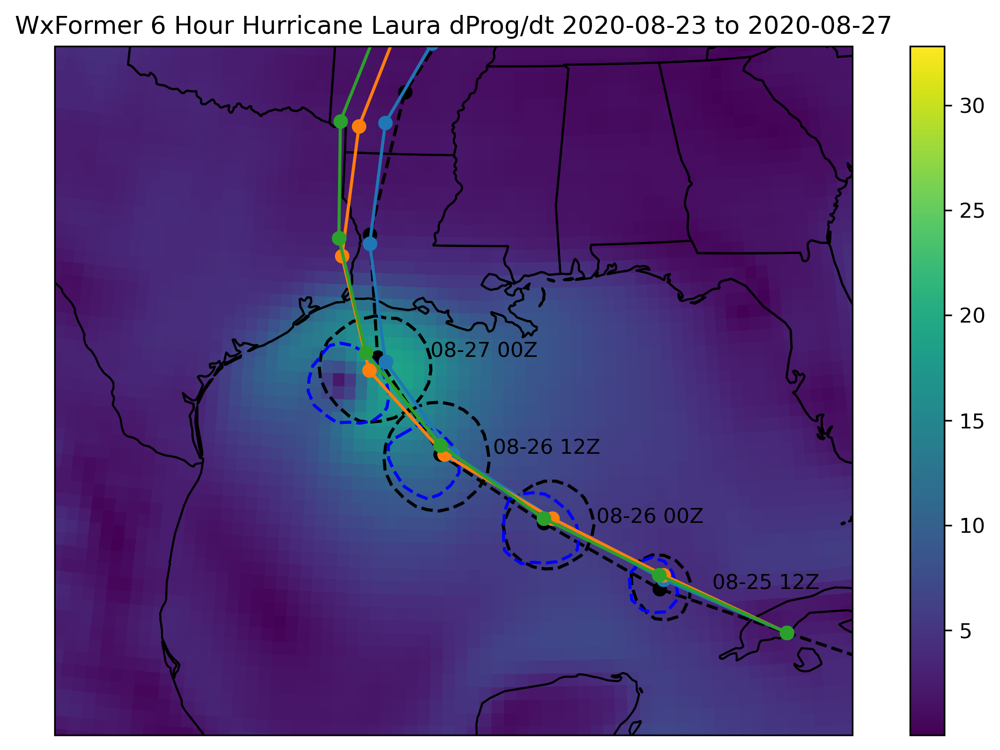

In [53]:
init_date = pd.Timestamp("2020-08-17")
end_date = pd.Timestamp("2020-08-27")
i_dates = pd.date_range(start=init_date, end=end_date,
                        freq="12h")
print(i_dates)
path = "/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/wxformer_6h_20241029" 
init_date_str = init_date.strftime("%Y-%m-%dT%HZ")
out_dir = "/glade/derecho/scratch/dgagne/credit_q500_images/"
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300, subplot_kw=dict(projection=ccrs.LambertConformal(central_latitude=30, central_longitude=270)))
#cmap = mpl.colormaps['Reds']
#colors = cmap(np.linspace(0, 1, 12))
cmap = mpl.colormaps['tab20']
colors = cmap(np.arange(0, 1, 0.05)[::-1])
valid_dates = pd.date_range(start="2020-08-25 12:00", end="2020-08-27", freq="12h")
ax.set_extent([260, 278, 20, 35], crs=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.STATES, edgecolor='k')
ax.plot(storm.lon[::2], storm.lat[::2], 'ko--', transform=ccrs.PlateCarree())
wxformer_ds = xr.open_dataset("/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/wxformer_1h_20241029/2020-08-25T00Z.nc")
for valid_date in valid_dates:
    print("Valid", valid_date)
    e5_arr = np.where(lsm < 0.3, era5_ds["SP"].loc[valid_date].values / 100, 2000.0)
    wx_arr = np.where(lsm < 0.3, wxformer_ds["SP"].loc[valid_date].values / 100, 2000.0)

    lon_g, lat_g = np.meshgrid(era5_ds["longitude"], era5_ds["latitude"])
    ax.contour(lon_g, lat_g, e5_arr, [1000], colors=['k'], transform_first=True, transform=ccrs.PlateCarree(), linestyles=['--'])
    ax.contour(lon_g, lat_g, wx_arr, [1000], colors=['b'], transform_first=True, transform=ccrs.PlateCarree(), linestyles=['--'])
    t = storm.time == valid_date
    ax.text(storm.lon[t], storm.lat[t], valid_date.strftime("        %m-%d %HZ"), transform=ccrs.PlateCarree(), fontsize=10)
for mod in ["AVNI", 'AEMI', "HWFI"]:
    adeck_ofci = adeck_recent.loc[adeck_recent[4] == mod]
    ax.plot(-adeck_ofci[7].str[:-1].astype(float) / 10, adeck_ofci[6].str[:-1].astype(float) / 10, 
         transform=ccrs.PlateCarree(), marker='o')
pc = ax.pcolormesh(lon_g, lat_g, np.sqrt(wxformer_ds["U"].loc["2020-08-27T00:00"][-1] ** 2 + wxformer_ds["V"].loc["2020-08-27T00:00"][-1] ** 2), 
              transform=ccrs.PlateCarree())
plt.colorbar(pc)
plt.title("WxFormer 6 Hour Hurricane Laura dProg/dt 2020-08-23 to 2020-08-27")

<xarray.Dataset> Size: 28GB
Dimensions:        (time: 120, level: 16, latitude: 640, longitude: 1280)
Coordinates:
  * time           (time) datetime64[ns] 960B 2020-08-25T01:00:00 ... 2020-08-30
  * level          (level) int64 128B 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15
  * latitude       (latitude) float64 5kB 89.78 89.51 89.23 ... -89.51 -89.78
  * longitude      (longitude) float64 10kB 0.0 0.2812 0.5625 ... 359.4 359.7
Data variables:
    U              (time, level, latitude, longitude) float32 6GB ...
    V              (time, level, latitude, longitude) float32 6GB ...
    T              (time, level, latitude, longitude) float32 6GB ...
    Q              (time, level, latitude, longitude) float32 6GB ...
    SP             (time, latitude, longitude) float32 393MB ...
    t2m            (time, latitude, longitude) float32 393MB ...
    V500           (time, latitude, longitude) float32 393MB ...
    U500           (time, latitude, longitude) float32 393MB ...
    T500           (time, latitude, longitude) float32 393MB ...
    Z500           (time, latitude, longitude) float32 393MB ...
    Q500           (time, latitude, longitude) float32 393MB ...
    forecast_hour  (time) int64 960B ...
Attributes:
    Conventions:  CF-1.11

Text(0.5, 0, 'Hours before valid time')

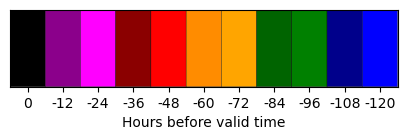

In [159]:
cmap = mpl.colormaps['tab20']
colors = cmap(np.arange(0, 1.0, 0.05))
color_list = ["k", "darkmagenta", "magenta",
                                   "darkred", "red", 
                                   "darkorange", "orange", 
                                   "darkgreen", "green", 
                                   "darkblue", "blue",
                                   ]
cmap2 = mpl.colors.ListedColormap(color_list)
plt.figure(figsize=(5, 1))
plt.pcolor(np.arange(0, 11).reshape(-1,1).T, cmap=cmap2, edgecolor='k')
plt.xticks(np.arange(11) + 0.5, np.arange(-12 * 10, 12, 12)[::-1])
plt.yticks([], [])
plt.xlabel("Hours before valid time")

In [142]:
colors = cmap(np.arange(0, 1.025, 0.025))
colors.shape

(41, 4)

In [92]:
np.arange(-12 * 10, 12, 12).size

11

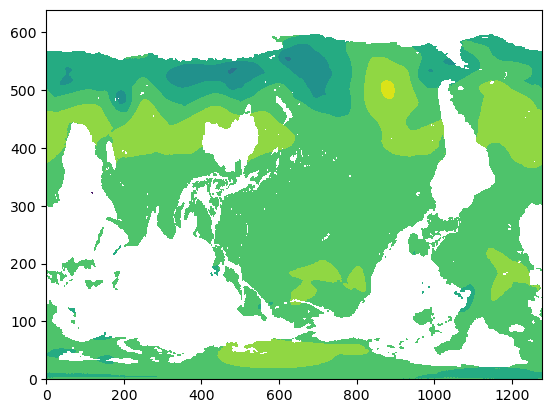

In [33]:
plt.contourf(plotted_arr)

DatetimeIndex(['2020-08-23 00:00:00', '2020-08-23 12:00:00',
               '2020-08-24 00:00:00', '2020-08-24 12:00:00',
               '2020-08-25 00:00:00', '2020-08-25 12:00:00',
               '2020-08-26 00:00:00'],
              dtype='datetime64[ns]', freq='12h')


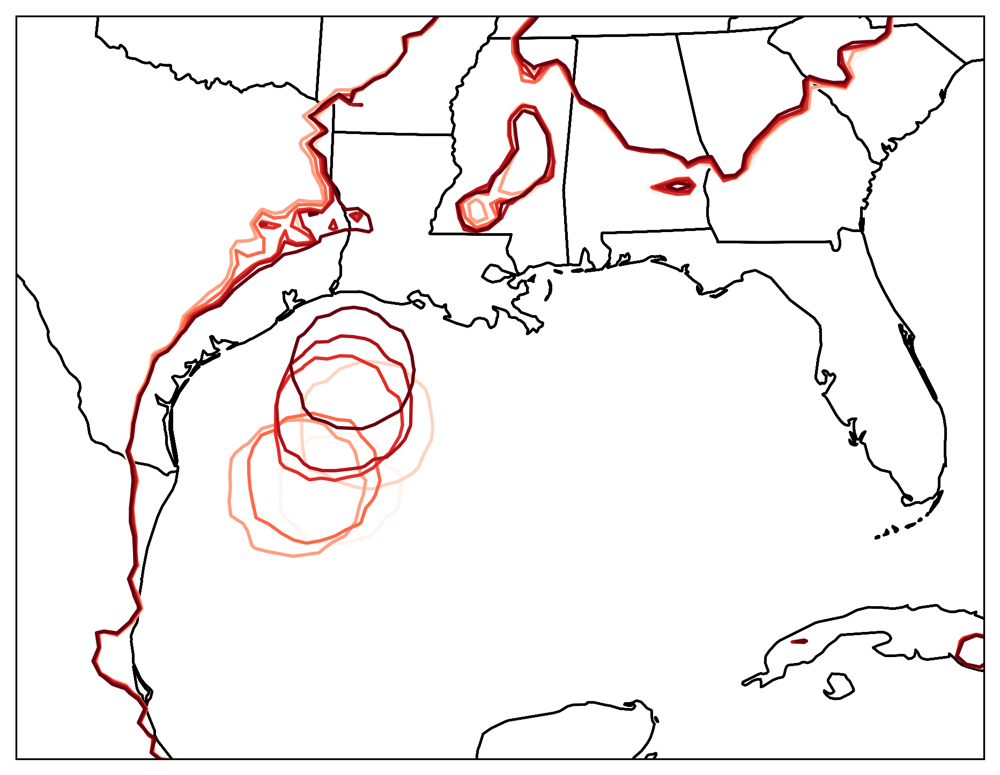

In [90]:
init_date = pd.Timestamp("2020-08-23")
i_dates = pd.date_range(start=init_date, end=init_date + pd.Timedelta(hours=72),
                        freq="12h")
print(i_dates)
valid_date = pd.Timestamp("2020-08-27")
path = "/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/wxformer_6h_20241029" 
init_date_str = init_date.strftime("%Y-%m-%dT%HZ")
out_dir = "/glade/derecho/scratch/dgagne/credit_q500_images/"
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300, subplot_kw=dict(projection=ccrs.LambertConformal(central_latitude=30, central_longitude=270)))
cmap = mpl.colormaps['Reds']
colors = cmap(np.linspace(0, 1, i_dates.size))
for i, i_date in enumerate(i_dates):
    i_date_str = i_date.strftime("%Y-%m-%dT%HZ")
    ax.set_extent([260, 280, 20, 35], crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.STATES, edgecolor='k')
    with xr.open_dataset(os.path.join(path, f"{i_date_str}.nc")) as f_ds:
        lon_g, lat_g = np.meshgrid(f_ds["longitude"], f_ds["latitude"])

        ax.contour(lon_g, lat_g, f_ds["SP"].loc[valid_date] / 100, [1000.0], colors=[colors[i]], transform_first=True, transform=ccrs.PlateCarree())
plt.show()

DatetimeIndex(['2020-08-23 00:00:00', '2020-08-23 12:00:00',
               '2020-08-24 00:00:00', '2020-08-24 12:00:00',
               '2020-08-25 00:00:00', '2020-08-25 12:00:00',
               '2020-08-26 00:00:00'],
              dtype='datetime64[ns]', freq='12h')


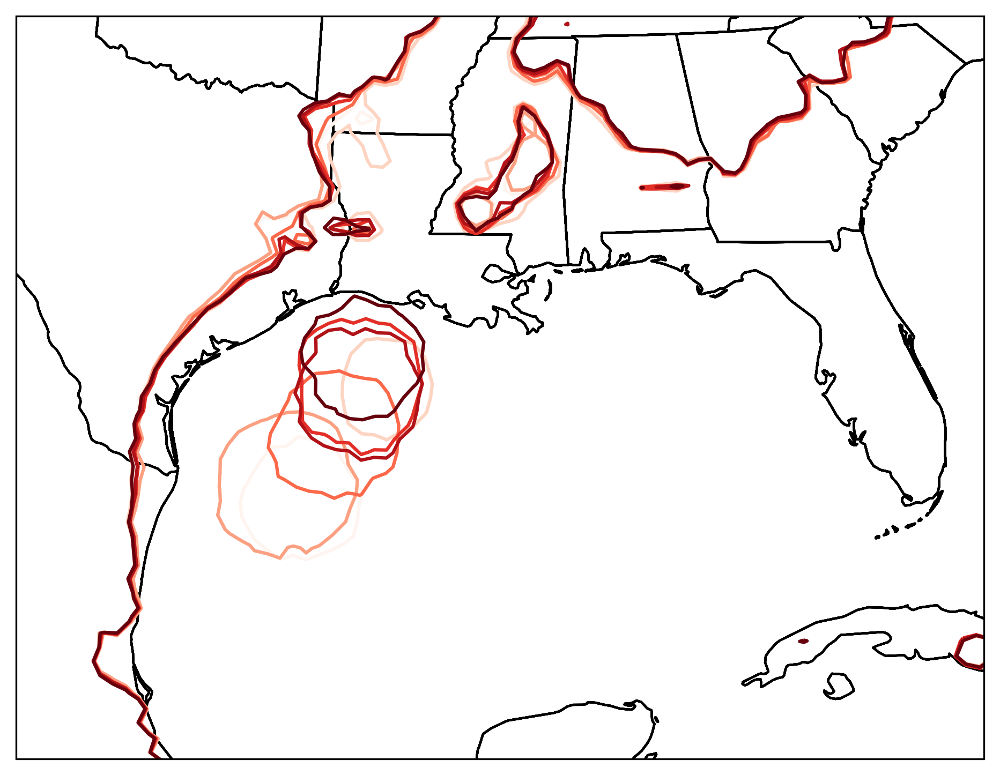

In [92]:
init_date = pd.Timestamp("2020-08-23")
i_dates = pd.date_range(start=init_date, end=init_date + pd.Timedelta(hours=72),
                        freq="12h")
print(i_dates)
valid_date = pd.Timestamp("2020-08-27")
path = "/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/fuxi_6h" 
init_date_str = init_date.strftime("%Y-%m-%dT%HZ")
out_dir = "/glade/derecho/scratch/dgagne/credit_q500_images/"
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300, subplot_kw=dict(projection=ccrs.LambertConformal(central_latitude=30, central_longitude=270)))
cmap = mpl.colormaps['Reds']
colors = cmap(np.linspace(0, 1, i_dates.size))
for i, i_date in enumerate(i_dates):
    i_date_str = i_date.strftime("%Y-%m-%dT%HZ")
    ax.set_extent([260, 280, 20, 35], crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.STATES, edgecolor='k')
    with xr.open_dataset(os.path.join(path, f"{i_date_str}.nc")) as f_ds:
        lon_g, lat_g = np.meshgrid(f_ds["longitude"], f_ds["latitude"])

        ax.contour(lon_g, lat_g, f_ds["SP"].loc[valid_date] / 100, [1000.0], colors=[colors[i]], transform_first=True, transform=ccrs.PlateCarree())
plt.show()

DatetimeIndex(['2020-08-23 00:00:00', '2020-08-23 12:00:00',
               '2020-08-24 00:00:00', '2020-08-24 12:00:00',
               '2020-08-25 00:00:00', '2020-08-25 12:00:00',
               '2020-08-26 00:00:00'],
              dtype='datetime64[ns]', freq='12h')


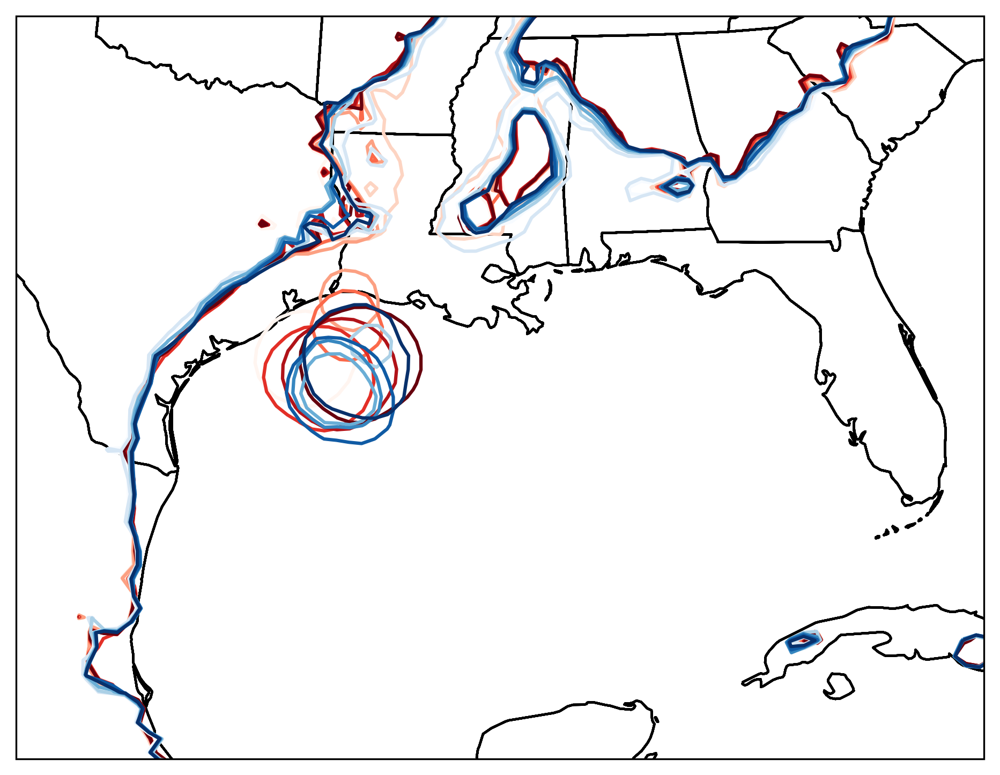

In [96]:
init_date = pd.Timestamp("2020-08-23")
i_dates = pd.date_range(start=init_date, end=init_date + pd.Timedelta(hours=72),
                        freq="12h")
print(i_dates)
valid_date = pd.Timestamp("2020-08-27")
path = "/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/IFS" 
init_date_str = init_date.strftime("%Y-%m-%dT%HZ")
out_dir = "/glade/derecho/scratch/dgagne/credit_q500_images/"
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300, subplot_kw=dict(projection=ccrs.LambertConformal(central_latitude=30, central_longitude=270)))
cmap = mpl.colormaps['Reds']
colors = cmap(np.linspace(0, 1, i_dates.size))
for i, i_date in enumerate(i_dates):
    i_date_str = i_date.strftime("%Y-%m-%dT%HZ")
    ax.set_extent([260, 280, 20, 35], crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.STATES, edgecolor='k')
    with xr.open_dataset(os.path.join(path, f"IFS_{i_date_str}.nc")) as f_ds:
        lon_g, lat_g = np.meshgrid(f_ds["lon"], f_ds["lat"])

        ax.contour(lon_g, lat_g, f_ds["SP"].loc[valid_date] / 100, [1000.0], colors=[colors[i]], transform_first=True, transform=ccrs.PlateCarree())
path = "/glade/campaign/cisl/aiml/ksha/CREDIT_arXiv/GATHER/wxformer_1h_20241029" 
cmap = mpl.colormaps['Blues']
colors = cmap(np.linspace(0, 1, i_dates.size))
for i, i_date in enumerate(i_dates):
    i_date_str = i_date.strftime("%Y-%m-%dT%HZ")
    ax.set_extent([260, 280, 20, 35], crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.STATES, edgecolor='k')
    with xr.open_dataset(os.path.join(path, f"{i_date_str}.nc")) as f_ds:
        lon_g, lat_g = np.meshgrid(f_ds["longitude"], f_ds["latitude"])

        ax.contour(lon_g, lat_g, f_ds["SP"].loc[valid_date] / 100, [1000.0], colors=[colors[i]], transform_first=True, transform=ccrs.PlateCarree())
plt.show()
plt.show()

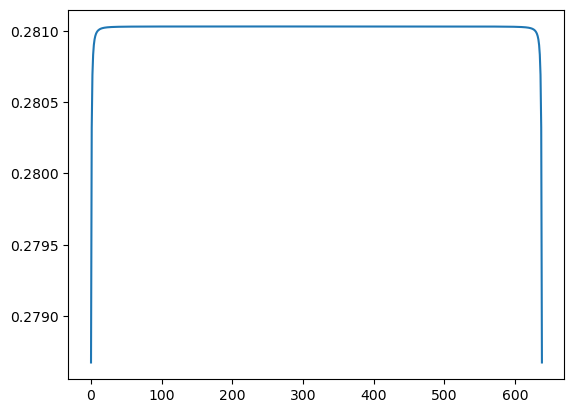

In [20]:

plt.plot(f_ds["latitude"][:-1].values - f_ds["latitude"][1:].values)


In [15]:
f_ds["longitude"][:-1].values - f_ds["longitude"][1:].values

array([-0.28125, -0.28125, -0.28125, ..., -0.28125, -0.28125, -0.28125])